# 🌿 Plant Disease Detection — Production Pipeline
**Stack:** Keras 3 · EfficientNetV2-S · TensorFlow backend · Streamlit deployment

**Pipeline:**
1. Kaggle → Dataset
2. EDA
3. tf.data Pipeline
4. Two-Phase Transfer Learning (EfficientNetV2-S)
5. Evaluation (F1, Confusion Matrix, ROC-AUC, Grad-CAM)
6. Export (.keras + INT8 TFLite)
7. Streamlit app generation

> **Runtime:** GPU (T4). Runtime → Change runtime type → T4 GPU

---
## Section 1 — Environment & Kaggle Dataset Ingestion

In [ ]:
# ── 1.1  Core imports ──────────────────────────────────────────────────────
import os, json, warnings, shutil
from pathlib import Path

os.environ['KERAS_BACKEND'] = 'tensorflow'
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import tensorflow as tf
import keras
from keras import layers, models, callbacks, mixed_precision

print(f'TensorFlow : {tf.__version__}')
print(f'Keras      : {keras.__version__}')

# ── 1.2  GPU verification ─────────────────────────────────────────────────
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    tf.config.experimental.set_memory_growth(gpus[0], True)
    print(f'GPU ready  : {gpus[0].name}')
else:
    print('⚠️  No GPU — switch runtime to T4 for full performance')

TensorFlow : 2.19.0
Keras      : 3.13.2
GPU ready  : /physical_device:GPU:0


In [ ]:
# ── 1.3  Kaggle authentication + download ─────────────────────────────────
# Upload your kaggle.json using the cell below, then run this cell.

from google.colab import files
print('Upload your kaggle.json now:')
uploaded = files.upload()          # pick kaggle.json from your machine

kaggle_dir = Path('/root/.kaggle')
kaggle_dir.mkdir(parents=True, exist_ok=True)
shutil.move('kaggle.json', kaggle_dir / 'kaggle.json')
os.chmod(kaggle_dir / 'kaggle.json', 0o600)
print('kaggle.json configured ✓')

Upload your kaggle.json now:


Saving kaggle.json to kaggle.json
kaggle.json configured ✓


In [ ]:
# ── 1.4  Dataset download (~1.5 GB) ───────────────────────────────────────
!pip install -q kaggle
!kaggle datasets download -d vipoooool/new-plant-diseases-dataset -q
!unzip -q new-plant-diseases-dataset.zip -d dataset/
!rm new-plant-diseases-dataset.zip
print('Dataset extracted ✓')

Dataset URL: https://www.kaggle.com/datasets/vipoooool/new-plant-diseases-dataset
License(s): copyright-authors
Dataset extracted ✓


In [ ]:
# ── 1.5  Directory resolution ─────────────────────────────────────────────
# The zip contains a nested directory — locate train/valid automatically.
def find_split_dirs(root: Path):
    for p in root.rglob('train'):
        if p.is_dir():
            return p.parent
    raise FileNotFoundError('Could not locate train/ directory')

base_dir   = find_split_dirs(Path('dataset'))
train_dir  = base_dir / 'train'
val_dir    = base_dir / 'valid'

class_names = sorted([d.name for d in train_dir.iterdir() if d.is_dir()])
NUM_CLASSES = len(class_names)

print(f'Train dir  : {train_dir}')
print(f'Val dir    : {val_dir}')
print(f'Classes    : {NUM_CLASSES}')

Train dir  : dataset/new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/train
Val dir    : dataset/new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/valid
Classes    : 38


---
## Section 2 — Exploratory Data Analysis

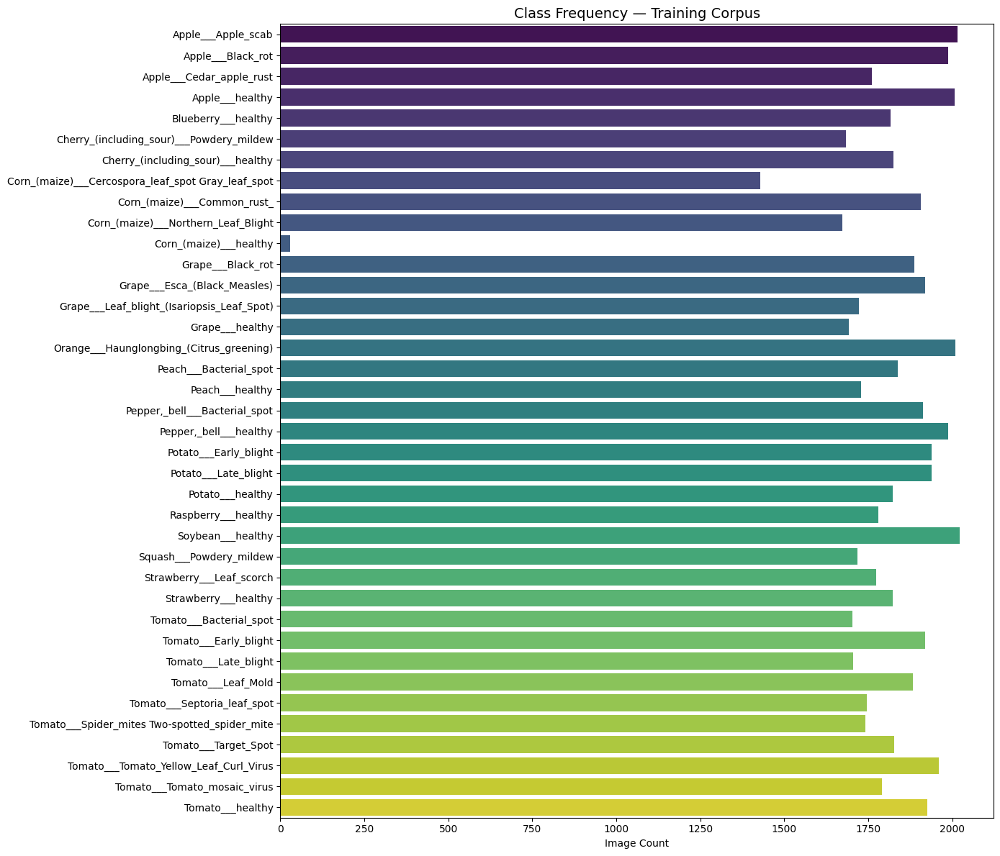

Min class  : Corn_(maize)___healthy (28 images)
Max class  : Soybean___healthy (2022 images)


In [ ]:
# ── 2.1  Class frequency distribution ────────────────────────────────────
freq = {cls: len(list((train_dir / cls).glob('*.JPG'))) for cls in class_names}

plt.figure(figsize=(14, 12))
sns.barplot(x=list(freq.values()), y=list(freq.keys()), palette='viridis')
plt.title('Class Frequency — Training Corpus', fontsize=14)
plt.xlabel('Image Count'); plt.tight_layout(); plt.show()

print(f'Min class  : {min(freq, key=freq.get)} ({min(freq.values())} images)')
print(f'Max class  : {max(freq, key=freq.get)} ({max(freq.values())} images)')

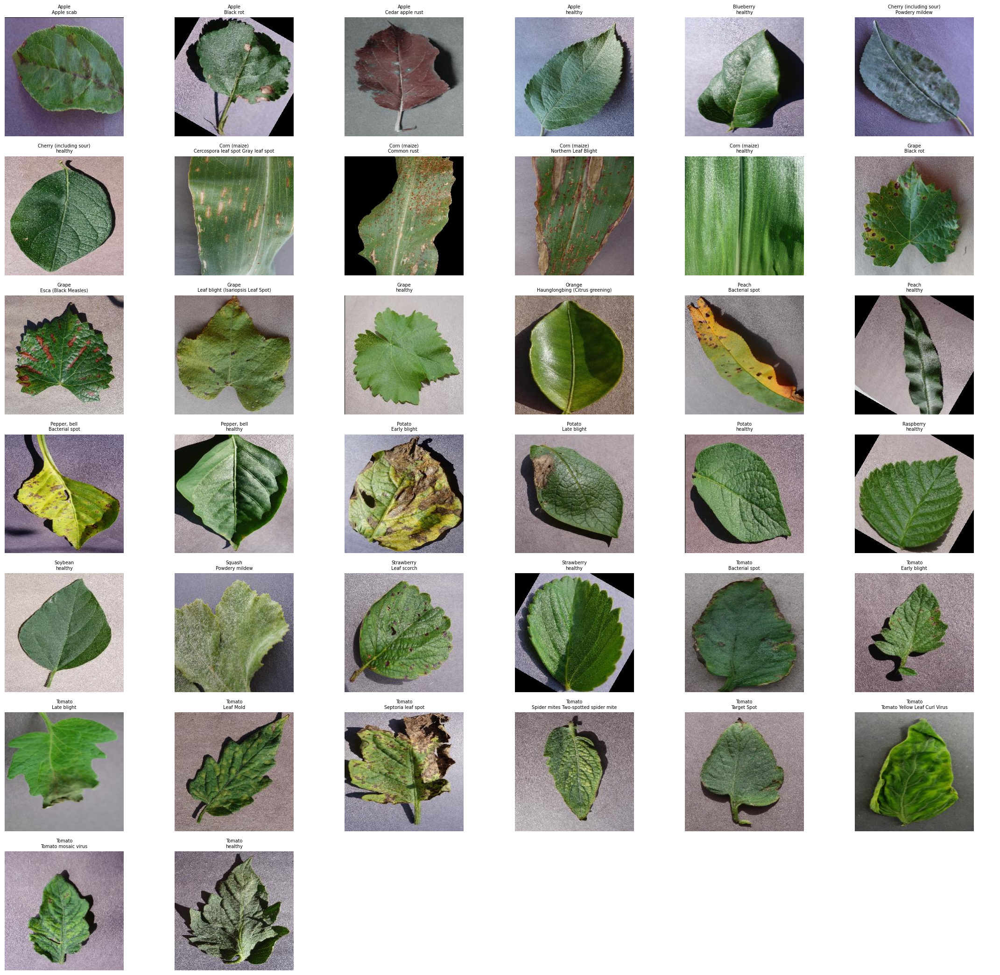

In [ ]:
# ── 2.2  Sample image grid (one per class) ────────────────────────────────
def sample_grid(train_path, class_list, cols=6):
    samples = {}
    for cls in class_list:
        imgs = list((train_path / cls).glob('*.JPG'))
        if imgs:
            samples[cls] = str(imgs[0])

    rows = int(np.ceil(len(samples) / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(22, 3 * rows))
    axes = axes.flatten()
    for i, (name, path) in enumerate(samples.items()):
        img = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
        axes[i].imshow(img)
        axes[i].set_title(name.replace('___', '\n').replace('_', ' '), fontsize=7)
        axes[i].axis('off')
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')
    plt.tight_layout(); plt.show()

sample_grid(train_dir, class_names)

---
## Section 3 — tf.data Pipeline

In [ ]:
BATCH_SIZE = 64
IMG_SIZE   = (224, 224)
AUTOTUNE   = tf.data.AUTOTUNE

# ── 3.1  Load raw datasets ────────────────────────────────────────────────
load_kwargs = dict(
    labels='inferred', label_mode='categorical',
    image_size=IMG_SIZE, batch_size=BATCH_SIZE, seed=42
)
train_ds_raw = keras.utils.image_dataset_from_directory(train_dir, shuffle=True,  **load_kwargs)
val_ds_raw   = keras.utils.image_dataset_from_directory(val_dir,   shuffle=True,  **load_kwargs)

# ── 3.2  Carve out a stratified blind test set (50% of val) ──────────────
val_batches  = tf.data.experimental.cardinality(val_ds_raw)
test_ds_raw  = val_ds_raw.take(val_batches // 2)
val_ds_raw   = val_ds_raw.skip(val_batches // 2)
print(f'Val batches : {tf.data.experimental.cardinality(val_ds_raw).numpy()}')
print(f'Test batches: {tf.data.experimental.cardinality(test_ds_raw).numpy()}')

# ── 3.3  Online stochastic augmentation (GPU-executed) ───────────────────
augment_layer = keras.Sequential([
    layers.RandomFlip('horizontal_and_vertical'),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
    layers.RandomContrast(0.1),
], name='online_augmentation')

# ── 3.4  Pipeline optimisation: cache → augment → prefetch ───────────────
def build_pipeline(ds, augment=False):
    # ds = ds.cache()
    if augment:
        ds = ds.map(lambda x, y: (augment_layer(x, training=True), y),
                    num_parallel_calls=AUTOTUNE)
    return ds.prefetch(AUTOTUNE)

train_ds = build_pipeline(train_ds_raw, augment=True)
val_ds   = build_pipeline(val_ds_raw,   augment=False)
test_ds  = build_pipeline(test_ds_raw,  augment=False)
print('Pipelines ready ✓')

Found 70295 files belonging to 38 classes.
Found 17572 files belonging to 38 classes.
Val batches : 138
Test batches: 137
Pipelines ready ✓


---
## Section 4 — EfficientNetV2-S Architecture

In [ ]:
def build_efficientnet(num_classes: int):
    """
    Two-phase transfer learning head.
    Phase 1 — base frozen   : train dense head only
    Phase 2 — partial unfreeze: fine-tune top 40% of backbone
    """
    inputs     = layers.Input(shape=IMG_SIZE + (3,))
    # EfficientNetV2S includes its own preprocessing — do NOT rescale manually
    base_model = keras.applications.EfficientNetV2S(
        include_top=False, weights='imagenet', input_tensor=inputs
    )
    base_model.trainable = False          # Phase 1: frozen

    x = layers.GlobalAveragePooling2D()(base_model.output)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.4)(x)
    # dtype='float32' keeps the head in full precision even with mixed precision
    outputs = layers.Dense(num_classes, activation='softmax', dtype='float32')(x)
    return models.Model(inputs, outputs, name='EfficientNetV2S_Plant')

model = build_efficientnet(NUM_CLASSES)
model.summary(line_length=90)

Model: "EfficientNetV2S_Plant"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)             ┃ Output Shape         ┃      Param # ┃ Connected to          ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1            │ (None, 224, 224, 3)  │            0 │ -                     │
│ (InputLayer)             │                      │              │                       │
├──────────────────────────┼──────────────────────┼──────────────┼───────────────────────┤
│ rescaling (Rescaling)    │ (None, 224, 224, 3)  │            0 │ input_layer_1[0][0]   │
├──────────────────────────┼──────────────────────┼──────────────┼───────────────────────┤
│ stem_conv (Conv2D)       │ (None, 112, 112, 24) │          648 │ rescaling[0][0]       │
├──────────────────────────┼──────────────────────┼──────────────┼───────────────────────┤
│ stem_bn                  │ (None, 112, 112, 24) │           96 │ stem_conv[0][0]       │
│ (BatchNormalization)     │                      │              │                       │
├──────────────────────────┼──────────────────────┼──────────────┼───────────────────────┤
│ stem_activation          │ (None, 112, 112, 24) │            0 │ stem_bn[0][0]         │
│ (Activation)             │                      │              │                       │
├──────────────────────────┼──────────────────────┼──────────────┼───────────────────────┤
│ block1a_project_conv     │ (None, 112, 112, 24) │        5,184 │ stem_activation[0][0] │
│ (Conv2D)                 │                      │              │                       │
├──────────────────────────┼──────────────────────┼──────────────┼───────────────────────┤
│ block1a_project_bn       │ (None, 112, 112, 24) │           96 │ block1a_project_conv… │
│ (BatchNormalization)     │                      │              │                       │
├──────────────────────────┼──────────────────────┼──────────────┼───────────────────────┤
│ block1a_project_activat… │ (None, 112, 112, 24) │            0 │ block1a_project_bn[0… │
│ (Activation)             │                      │              │                       │
├──────────────────────────┼──────────────────────┼──────────────┼───────────────────────┤
│ block1a_add (Add)        │ (None, 112, 112, 24) │            0 │ block1a_project_acti… │
│                          │                      │              │ stem_activation[0][0] │
├──────────────────────────┼──────────────────────┼──────────────┼───────────────────────┤
│ block1b_project_conv     │ (None, 112, 112, 24) │        5,184 │ block1a_add[0][0]     │
│ (Conv2D)                 │                      │              │                       │
├──────────────────────────┼──────────────────────┼──────────────┼───────────────────────┤
│ block1b_project_bn       │ (None, 112, 112, 24) │           96 │ block1b_project_conv… │
│ (BatchNormalization)     │                      │              │                       │
├──────────────────────────┼──────────────────────┼──────────────┼───────────────────────┤
│ block1b_project_activat… │ (None, 112, 112, 24) │            0 │ block1b_project_bn[0… │
│ (Activation)             │                      │              │                       │
├──────────────────────────┼──────────────────────┼──────────────┼───────────────────────┤
│ block1b_drop (Dropout)   │ (None, 112, 112, 24) │            0 │ block1b_project_acti… │
├──────────────────────────┼──────────────────────┼──────────────┼───────────────────────┤
│ block1b_add (Add)        │ (None, 112, 112, 24) │            0 │ block1b_drop[0][0],   │
│                          │                      │              │ block1a_add[0][0]     │
├──────────────────────────┼──────────────────────┼──────────────┼───────────────────────┤
│ block2a_expand_conv      │ (None, 56, 56, 96)   │       20,736 │ block1b_add[0][0]     │
│ (Conv2D)                 │                      │              │                     

 Total params: 20,385,158 (77.76 MB)

 Trainable params: 51,238 (200.15 KB)

 Non-trainable params: 20,333,920 (77.57 MB)

---
## Section 5 — Training Configuration

In [ ]:
from sklearn.utils.class_weight import compute_class_weight

# ── 5.1  Mixed precision ─────────────────────────────────────────────────
mixed_precision.set_global_policy('mixed_float16')
print(f"Compute dtype : {mixed_precision.global_policy().compute_dtype}")

# ── 5.2  Class weights (inverse frequency) ───────────────────────────────
y_indices = []
for _, labels in train_ds_raw.unbatch():
    y_indices.append(np.argmax(labels.numpy()))
y_indices = np.array(y_indices)

weights = compute_class_weight('balanced', classes=np.unique(y_indices), y=y_indices)
class_weights = {i: w for i, w in enumerate(weights)}
print(f"Class weights computed for {len(class_weights)} classes ✓")

Compute dtype : float16
Class weights computed for 38 classes ✓


---
## Section 6 — Two-Phase Training

In [ ]:
EPOCHS_P1      = 8
EPOCHS_P2      = 5
STEPS          = len(train_ds)
CHECKPOINT     = 'efficientnet_v2s_best.keras'

cb = [
    callbacks.ModelCheckpoint(CHECKPOINT, save_best_only=True,
                               monitor='val_accuracy', verbose=1),
    callbacks.EarlyStopping(patience=7, restore_best_weights=True,
                             monitor='val_accuracy', verbose=1),
    callbacks.TensorBoard(log_dir='logs/'),
]

# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
# PHASE 1 — train classification head only
# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
lr_p1 = keras.optimizers.schedules.CosineDecay(
    initial_learning_rate=1e-3,
    decay_steps=STEPS * EPOCHS_P1,
    alpha=0.01
)
model.compile(
    optimizer=keras.optimizers.Adam(lr_p1),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)
print('═'*50, '\nPhase 1 — Feature Extraction\n' + '═'*50)
hist_p1 = model.fit(
    train_ds, validation_data=val_ds,
    epochs=EPOCHS_P1, callbacks=cb,
    class_weight=class_weights
)

══════════════════════════════════════════════════ 
Phase 1 — Feature Extraction
══════════════════════════════════════════════════
Epoch 1/8
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 0s 786ms/step - accuracy: 0.7070 - loss: 1.0514
Epoch 1: val_accuracy improved from None to 0.93707, saving model to efficientnet_v2s_best.keras

Epoch 1: finished saving model to efficientnet_v2s_best.keras
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 990s 844ms/step - accuracy: 0.8261 - loss: 0.5809 - val_accuracy: 0.9371 - val_loss: 0.1946
Epoch 2/8
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 0s 753ms/step - accuracy: 0.9021 - loss: 0.3094
Epoch 2: val_accuracy improved from 0.93707 to 0.94730, saving model to efficientnet_v2s_best.keras

Epoch 2: finished saving model to efficientnet_v2s_best.keras
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 863s 784ms/step - accuracy: 0.9060 - loss: 0.2934 - val_accuracy: 0.9473 - val_loss: 0.1514
Epoch 3/8
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 0s 748ms/step - accuracy: 0.9150 - loss: 0.2586
Epoch 3: val_accuracy improved f

In [ ]:
# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
# PHASE 2 — unfreeze top 40% of backbone and fine-tune
# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
# Find the backbone by checking for EfficientNet layer type instead of name
backbone = None
for layer in model.layers:
    if 'efficientnet' in layer.name.lower():
        backbone = layer
        break

# If still not found, the model is flat — freeze by layer index directly
if backbone is None:
    print("Flat model detected — freezing by index")
    # Make all layers trainable first
    model.trainable = True
    # Then freeze bottom 60% of total model layers
    freeze_until = int(len(model.layers) * 0.60)
    for layer in model.layers[:freeze_until]:
        layer.trainable = False
    print(f"Frozen: {freeze_until} layers, Trainable: {len(model.layers) - freeze_until} layers")
else:
    backbone.trainable = True
    freeze_until = int(len(backbone.layers) * 0.60)
    for layer in backbone.layers[:freeze_until]:
        layer.trainable = False
    print(f"Backbone found: {backbone.name}")

# replace the trainable_p2 line with this
if backbone is None:
    trainable_p2 = sum(1 for l in model.layers if l.trainable)
else:
    trainable_p2 = sum(1 for l in backbone.layers if l.trainable)
print(f'Trainable layers in Phase 2: {trainable_p2}')

lr_p2 = keras.optimizers.schedules.CosineDecay(
    initial_learning_rate=1e-5,
    decay_steps=STEPS * EPOCHS_P2,
    alpha=0.01
)
model.compile(
    optimizer=keras.optimizers.Adam(lr_p2),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)
print('═'*50, '\nPhase 2 — Backbone Fine-Tuning\n' + '═'*50)
hist_p2 = model.fit(
    train_ds, validation_data=val_ds,
    epochs=EPOCHS_P2, callbacks=cb,
    class_weight=class_weights
)

# Merge histories for plotting
combined = {k: hist_p1.history[k] + hist_p2.history[k] for k in hist_p1.history}
with open('training_history.json', 'w') as f:
    json.dump(combined, f)
print('\nHistory saved ✓')

Flat model detected — freezing by index
Frozen: 310 layers, Trainable: 207 layers
Trainable layers in Phase 2: 4
══════════════════════════════════════════════════ 
Phase 2 — Backbone Fine-Tuning
══════════════════════════════════════════════════
Epoch 1/5
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 0s 772ms/step - accuracy: 0.9341 - loss: 0.2028
Epoch 1: val_accuracy did not improve from 0.96592
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 950s 817ms/step - accuracy: 0.9338 - loss: 0.2028 - val_accuracy: 0.9657 - val_loss: 0.1026
Epoch 2/5
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 0s 757ms/step - accuracy: 0.9354 - loss: 0.1972
Epoch 2: val_accuracy did not improve from 0.96592
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 866s 787ms/step - accuracy: 0.9345 - loss: 0.1967 - val_accuracy: 0.9657 - val_loss: 0.1024
Epoch 3/5
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 0s 764ms/step - accuracy: 0.9347 - loss: 0.1989
Epoch 3: val_accuracy improved from 0.96592 to 0.96615, saving model to efficientnet_v2s_best.keras

Epoch 3: finished saving model to eff

In [ ]:
# ── Learning curve plot ───────────────────────────────────────────────────
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
split = EPOCHS_P1

for ax, metric, title in [
    (ax1, 'accuracy',  'Accuracy'),
    (ax2, 'loss',      'Loss')
]:
    ax.plot(combined[metric],        label='Train',      lw=2)
    ax.plot(combined[f'val_{metric}'],label='Validation', lw=2)
    ax.axvline(split - 1, color='red', ls='--', alpha=.7, label='Fine-tune start')
    ax.set_title(title, fontsize=14); ax.legend(); ax.grid(alpha=.3)

plt.tight_layout(); plt.show()

---
## Section 7 — Evaluation (F1 · Confusion Matrix · ROC-AUC · Grad-CAM)

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize

# ── 7.1  Blind test inference ─────────────────────────────────────────────
y_true, y_pred_probs = [], []
for images, labels in test_ds:
    y_true.extend(np.argmax(labels.numpy(), axis=1))
    y_pred_probs.extend(model.predict(images, verbose=0))

y_true       = np.array(y_true)
y_pred_probs = np.array(y_pred_probs)
y_pred       = np.argmax(y_pred_probs, axis=1)

# ── 7.2  Aggregated metrics ───────────────────────────────────────────────
report = classification_report(y_true, y_pred, target_names=class_names, output_dict=True)
print(f"Macro F1     : {report['macro avg']['f1-score']:.4f}")
print(f"Weighted F1  : {report['weighted avg']['f1-score']:.4f}")
print(f"Test Accuracy: {(y_true == y_pred).mean():.4f}")

Macro F1     : 0.9672
Weighted F1  : 0.9675
Test Accuracy: 0.9674


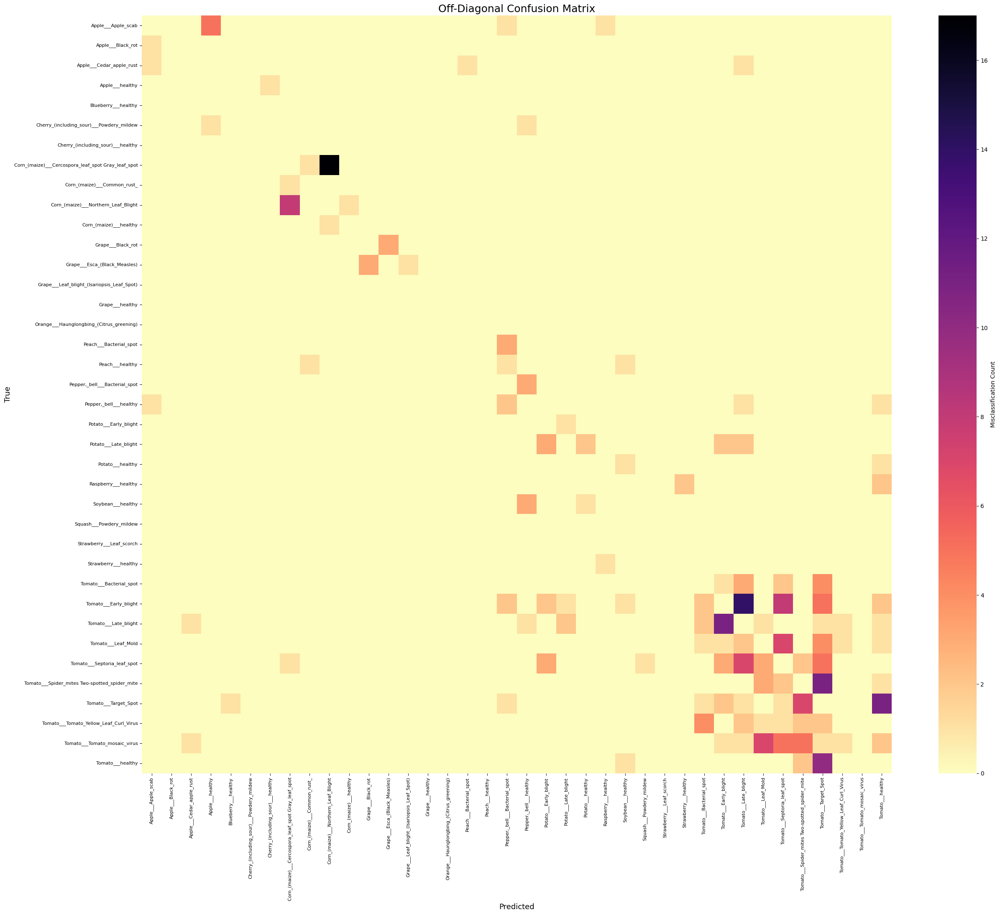


--- Top 3 confused pairs ---
  17 errors | True: Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot  →  Pred: Corn_(maize)___Northern_Leaf_Blight
  14 errors | True: Tomato___Early_blight  →  Pred: Tomato___Late_blight
  11 errors | True: Tomato___Late_blight  →  Pred: Tomato___Early_blight


In [16]:
# ── 7.3  Off-diagonal confusion matrix ───────────────────────────────────
cm = confusion_matrix(y_true, y_pred)
np.fill_diagonal(cm, 0)          # mask correct predictions to surface errors

plt.figure(figsize=(26, 22))
sns.heatmap(cm, cmap='magma_r',
            xticklabels=class_names, yticklabels=class_names,
            annot=False, cbar_kws={'label': 'Misclassification Count'})
plt.title('Off-Diagonal Confusion Matrix', fontsize=18)
plt.xlabel('Predicted', fontsize=13); plt.ylabel('True', fontsize=13)
plt.xticks(rotation=90, fontsize=8); plt.yticks(fontsize=8)
plt.tight_layout(); plt.show()

# Top-3 confused pairs
flat = cm.flatten()
print('\n--- Top 3 confused pairs ---')
for idx in flat.argsort()[-3:][::-1]:
    t, p = divmod(idx, NUM_CLASSES)
    if cm[t, p] > 0:
        print(f"  {cm[t,p]} errors | True: {class_names[t]}  →  Pred: {class_names[p]}")

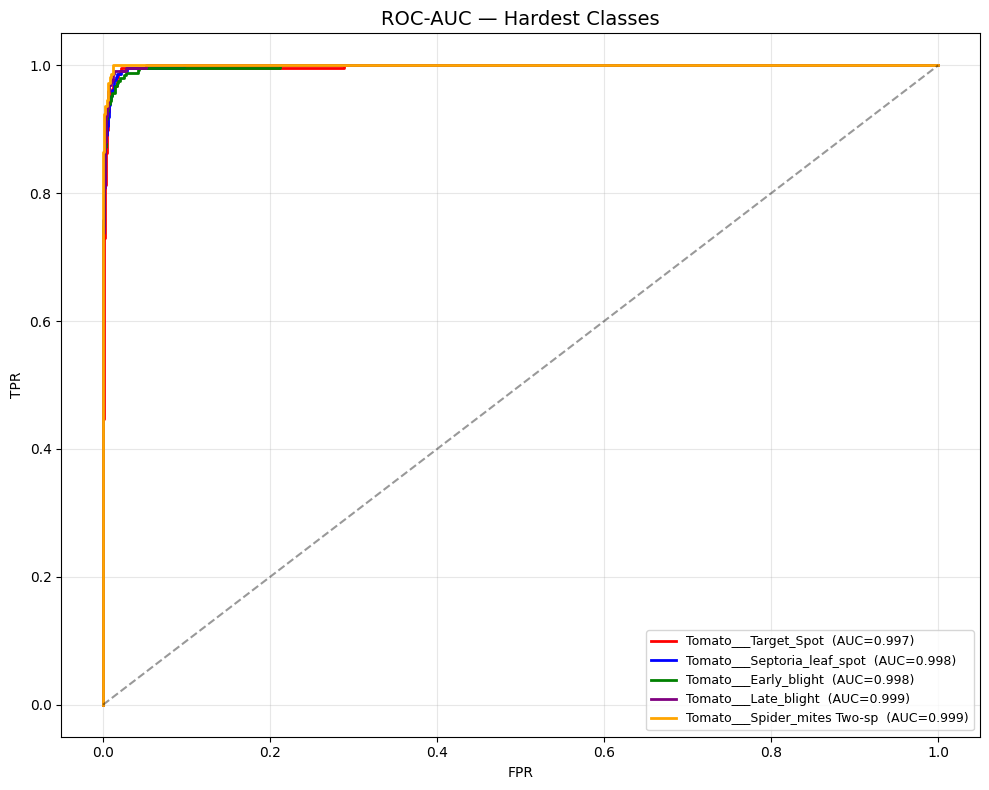

In [17]:
# ── 7.4  ROC-AUC for the 5 worst-performing classes ──────────────────────
class_f1 = {cls: report[cls]['f1-score'] for cls in class_names}
worst5   = sorted(class_f1, key=class_f1.get)[:5]
y_bin    = label_binarize(y_true, classes=range(NUM_CLASSES))

plt.figure(figsize=(10, 8))
for color, cls in zip(['red','blue','green','purple','orange'], worst5):
    i = class_names.index(cls)
    fpr, tpr, _ = roc_curve(y_bin[:, i], y_pred_probs[:, i])
    plt.plot(fpr, tpr, color=color, lw=2,
             label=f'{cls[:28]}  (AUC={auc(fpr,tpr):.3f})')
plt.plot([0,1],[0,1],'k--',alpha=.4)
plt.xlabel('FPR'); plt.ylabel('TPR')
plt.title('ROC-AUC — Hardest Classes', fontsize=14)
plt.legend(fontsize=9); plt.grid(alpha=.3)
plt.tight_layout(); plt.show()

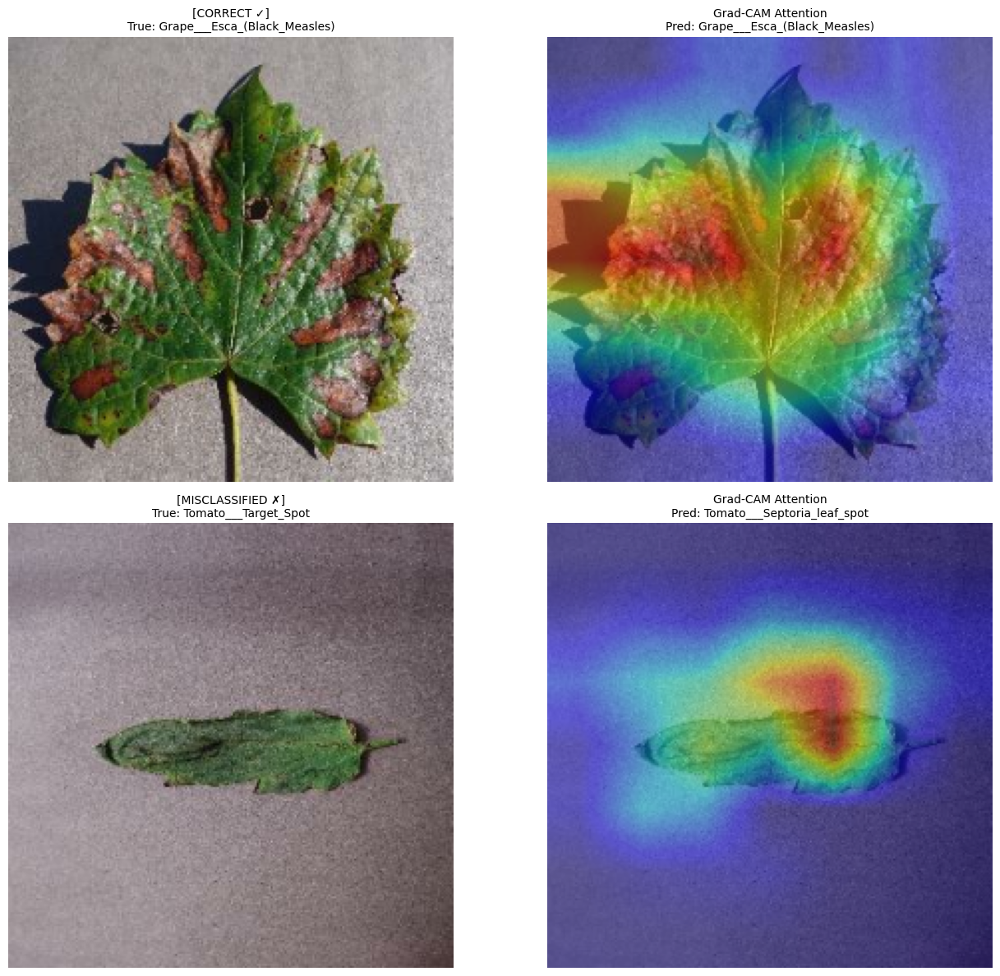

In [19]:
# ── 7.5  Grad-CAM ─────────────────────────────────────────────────────────
import matplotlib.cm as mpl_cm

LAST_CONV = 'top_activation'
backbone  = model   # flat model, use directly

def gradcam(img_tensor):
    grad_model = keras.models.Model(
        inputs=model.inputs,
        outputs=[model.get_layer(LAST_CONV).output, model.output]
    )
    with tf.GradientTape() as tape:
        conv_out, preds = grad_model(img_tensor)
        top_class = tf.argmax(preds[0])
        score     = preds[:, top_class]
    grads    = tape.gradient(score, conv_out)
    weights  = tf.reduce_mean(grads, axis=(0, 1, 2))
    cam      = tf.maximum(conv_out[0] @ weights[..., tf.newaxis], 0)
    cam      = cam.numpy().squeeze()
    cam      = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
    return cam, preds.numpy()[0]

def overlay(img_np, cam, alpha=0.45):
    h, w = img_np.shape[:2]
    cam_resized = cv2.resize(cam, (w, h))
    colormap    = mpl_cm.get_cmap('jet')(cam_resized)[:, :, :3]
    blended     = (colormap * 255 * alpha + img_np * (1 - alpha)).astype(np.uint8)
    return blended

# Find one correct + one wrong prediction from test set
correct = incorrect = None
for imgs, lbls in test_ds.unbatch().take(500):
    t = int(np.argmax(lbls.numpy()))
    p = int(np.argmax(model.predict(tf.expand_dims(imgs, 0), verbose=0)))
    entry = (imgs.numpy().astype(np.uint8), t, p)
    if t == p and correct   is None: correct   = entry
    if t != p and incorrect is None: incorrect = entry
    if correct and incorrect: break

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
for row, (img, t, p) in enumerate([correct, incorrect]):
    tensor = tf.expand_dims(img, 0)
    cam, _  = gradcam(tensor)
    blend   = overlay(img, cam)
    status  = 'CORRECT ✓' if row == 0 else 'MISCLASSIFIED ✗'
    axes[row, 0].imshow(img)
    axes[row, 0].set_title(f'[{status}]\nTrue: {class_names[t]}', fontsize=10)
    axes[row, 0].axis('off')
    axes[row, 1].imshow(blend)
    axes[row, 1].set_title(f'Grad-CAM Attention\nPred: {class_names[p]}', fontsize=10)
    axes[row, 1].axis('off')
plt.tight_layout(); plt.show()

---
## Section 8 — Export (.keras + INT8 TFLite)

In [20]:
# ── 8.1  Full-precision saves ─────────────────────────────────────────────
model.save('plant_disease_efficientnet.keras')
model.export('saved_model/plant_disease_efficientnet')
print('Full-precision exports done ✓')

# ── 8.2  INT8 TFLite quantization ────────────────────────────────────────
def rep_dataset():
    for x, _ in val_ds.unbatch().take(100):
        yield [tf.expand_dims(x, 0)]

converter = tf.lite.TFLiteConverter.from_keras_model(model)
converter.optimizations             = [tf.lite.Optimize.DEFAULT]
converter.representative_dataset    = rep_dataset
converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS_INT8]
converter.inference_input_type      = tf.uint8
converter.inference_output_type     = tf.uint8

print('Quantizing (this takes a few minutes)...')
try:
    tflite_model = converter.convert()
    with open('plant_disease_INT8.tflite', 'wb') as f:
        f.write(tflite_model)
    sz_fp32 = os.path.getsize('plant_disease_efficientnet.keras') / 1e6
    sz_int8 = os.path.getsize('plant_disease_INT8.tflite') / 1e6
    print(f'FP32 .keras : {sz_fp32:.1f} MB')
    print(f'INT8 .tflite: {sz_int8:.1f} MB  ({sz_fp32/sz_int8:.1f}x compression)')
except Exception as e:
    print(f'Quantization failed: {e}')

Saved artifact at 'saved_model/plant_disease_efficientnet'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_5')
Output Type:
  TensorSpec(shape=(None, 38), dtype=tf.float32, name=None)
Captures:
  139749766409168: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139749766410704: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139749766411280: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139749766410320: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139749766409936: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139749766409744: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139749766410896: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139749766412240: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139749766413008: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139749766413584: TensorSpec(shape=(), dtype=tf.resource, na

In [21]:
# ── 8.3  Save class names alongside the model ─────────────────────────────
with open('class_names.json', 'w') as f:
    json.dump(class_names, f)
print('class_names.json saved ✓')

# ── 8.4  Download artefacts from Colab ───────────────────────────────────
from google.colab import files
for fname in ['plant_disease_efficientnet.keras', 'class_names.json',
              'training_history.json']:
    print(f'Downloading {fname}...')
    files.download(fname)

class_names.json saved ✓


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>